#**How to Train YOLO11 Object Detection Model on a Custom Dataset**

In [77]:
!nvidia-smi

Mon Dec  2 20:10:33 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8               9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

**Step 01 # Install the Ultralytics Package**

In [78]:
!pip install ultralytics

**Step 02 # Import All the Requried Libraries**

In [79]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.0/112.6 GB disk)


In [80]:
from ultralytics import YOLO
from IPython.display import Image

**Step # 03 Download Dataset from Roboflow**

In [81]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="5hLKldCXmDSTjS0Xjz2D")
project = rf.workspace("strawberry-tdz0i").project("retail-shelf-avialability-tqwlp")
version = project.version(3)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...


In [82]:
dataset.location

'/content/retail-shelf-avialability-3'

**Step # 04 Train YOLO11 Model on a Custom Dataset**

In [83]:
!yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo11n.pt" epochs=20 imgsz=640

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/retail-shelf-avialability-3/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_

**Step # 05 Examine Training Results**

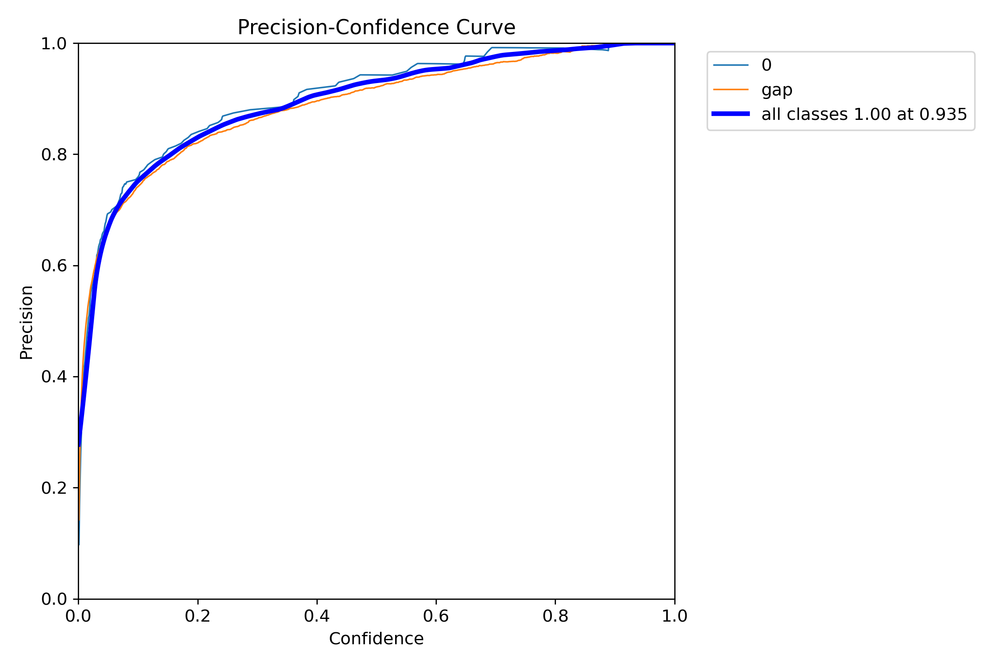

In [97]:
Image("/content/runs/detect/train2/P_curve.png", width=600)

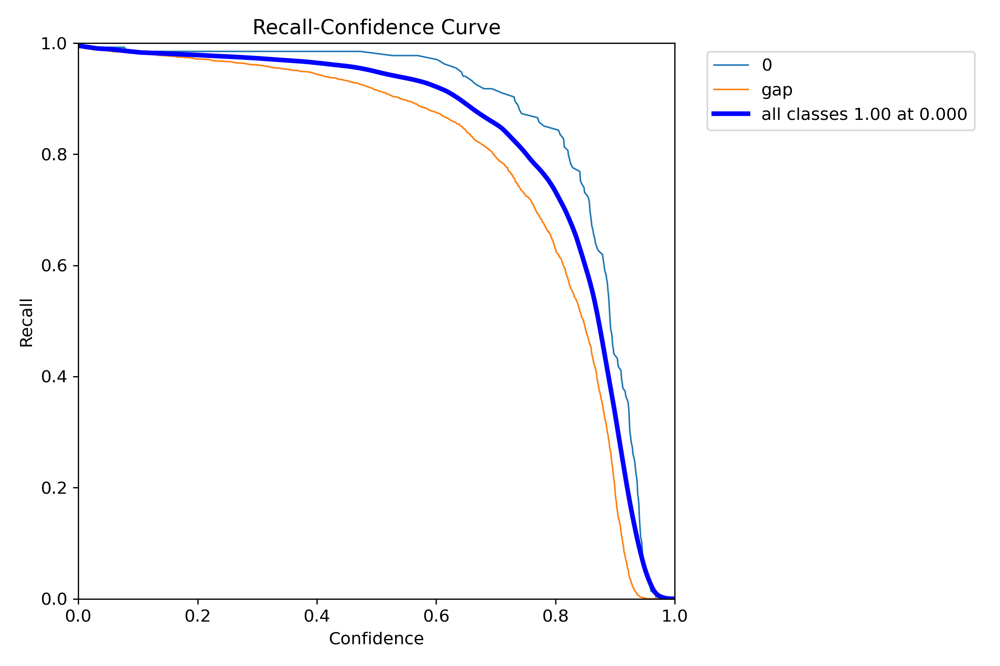

In [98]:
Image("/content/runs/detect/train2/R_curve.png", width=600)

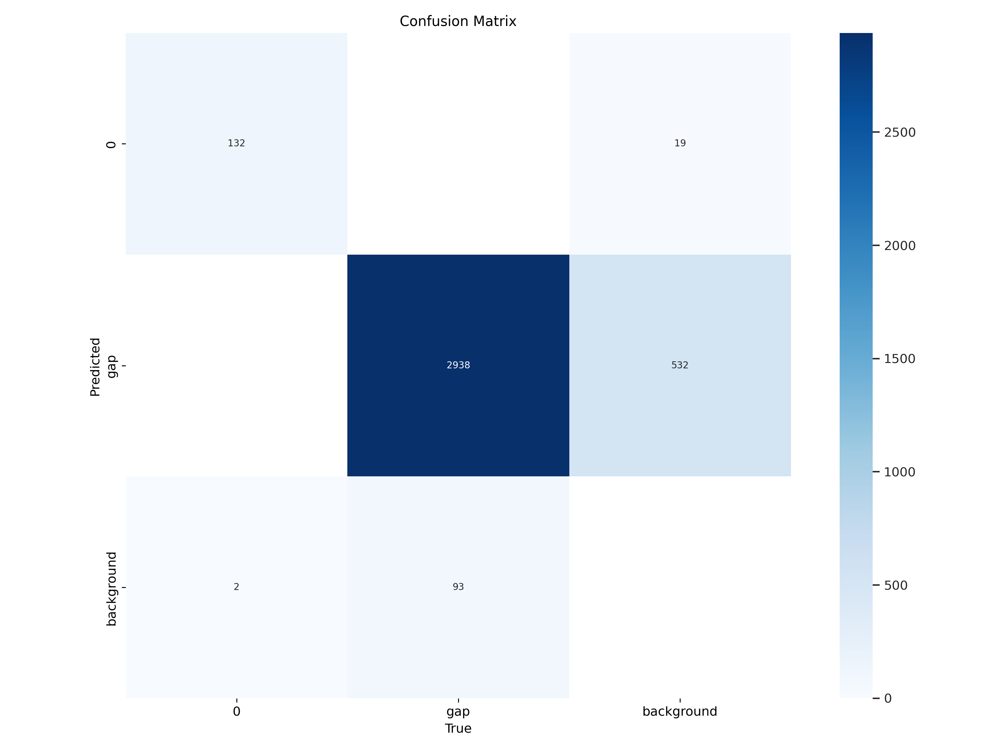

In [99]:
Image("/content/runs/detect/train2/confusion_matrix.png", width=600)

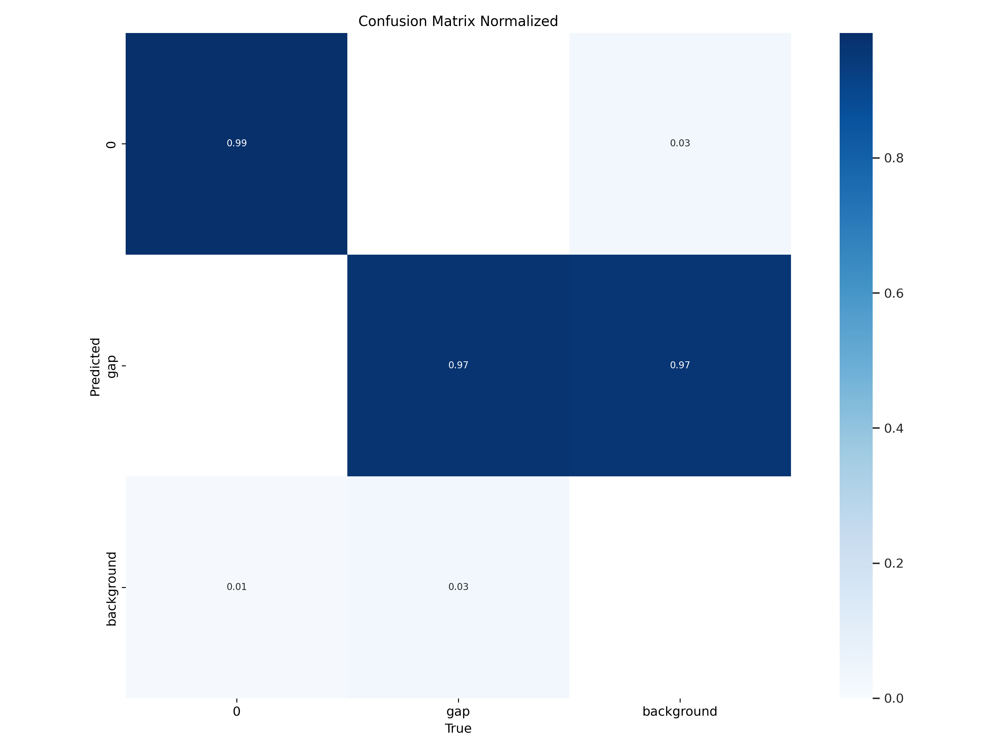

In [100]:
Image("/content/runs/detect/train2/confusion_matrix_normalized.png", width=600)

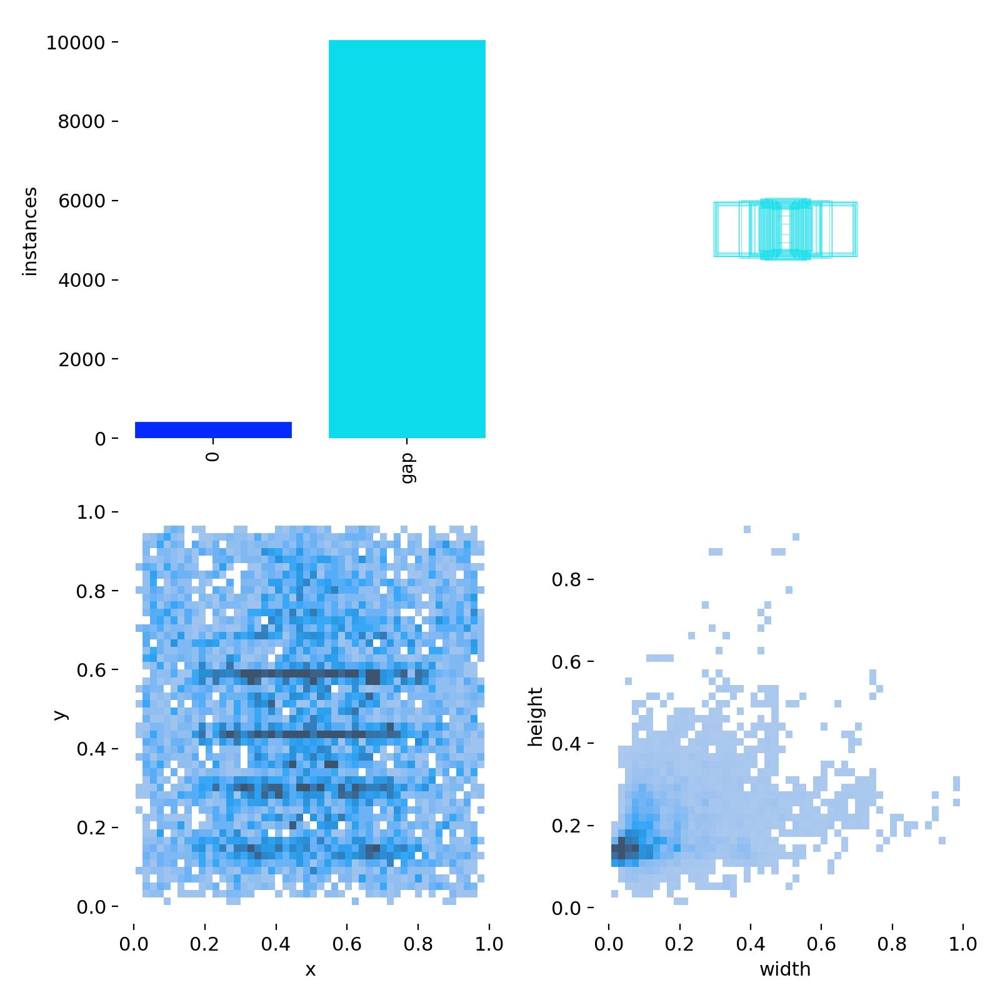

In [101]:
Image("/content/runs/detect/train2/labels.jpg", width=600)

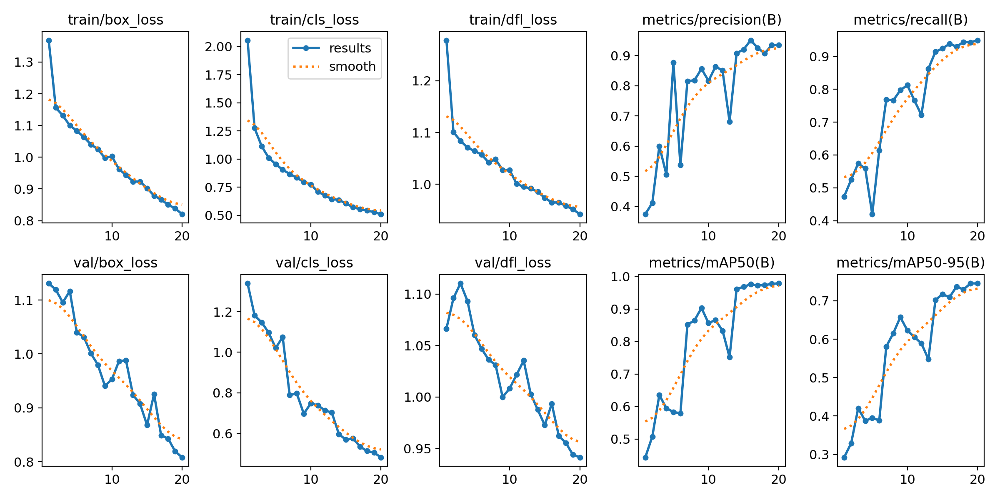

In [102]:
Image("/content/runs/detect/train2/results.png", width=600)

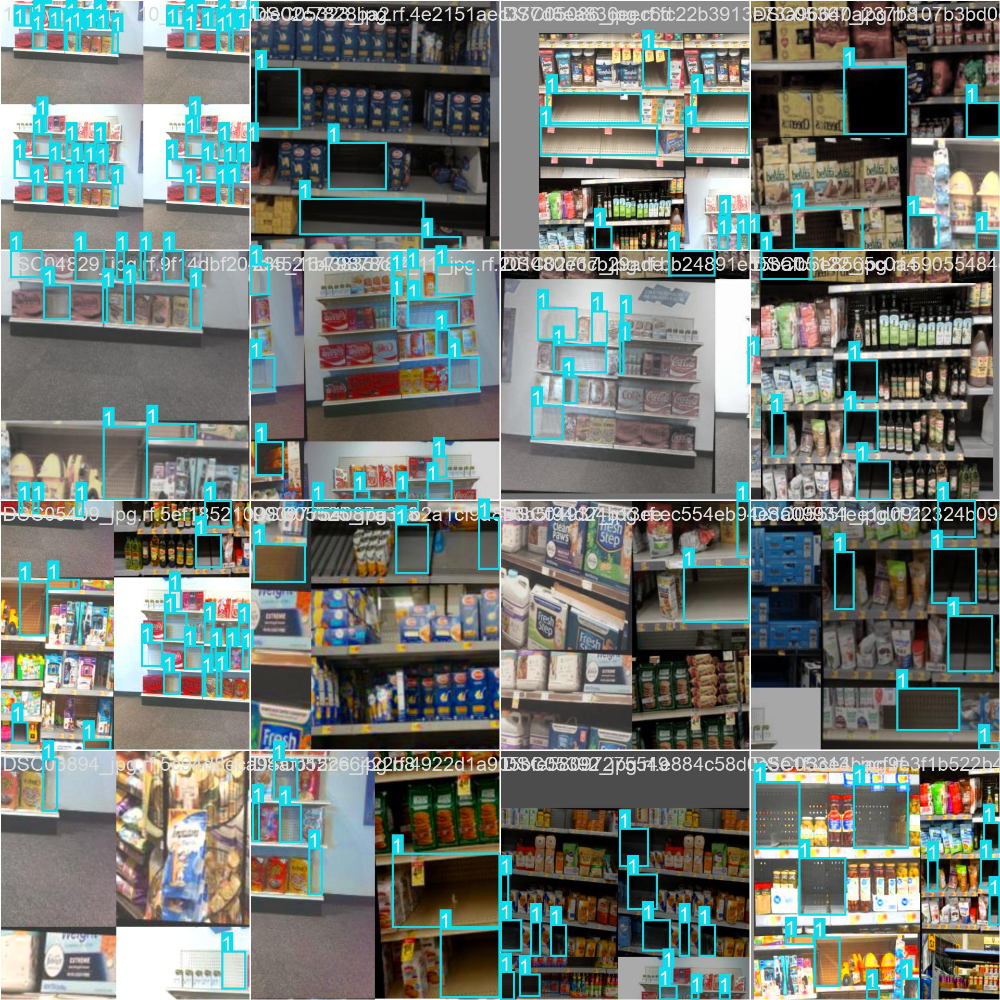

In [90]:
Image("/content/runs/detect/train/train_batch0.jpg", width=600)

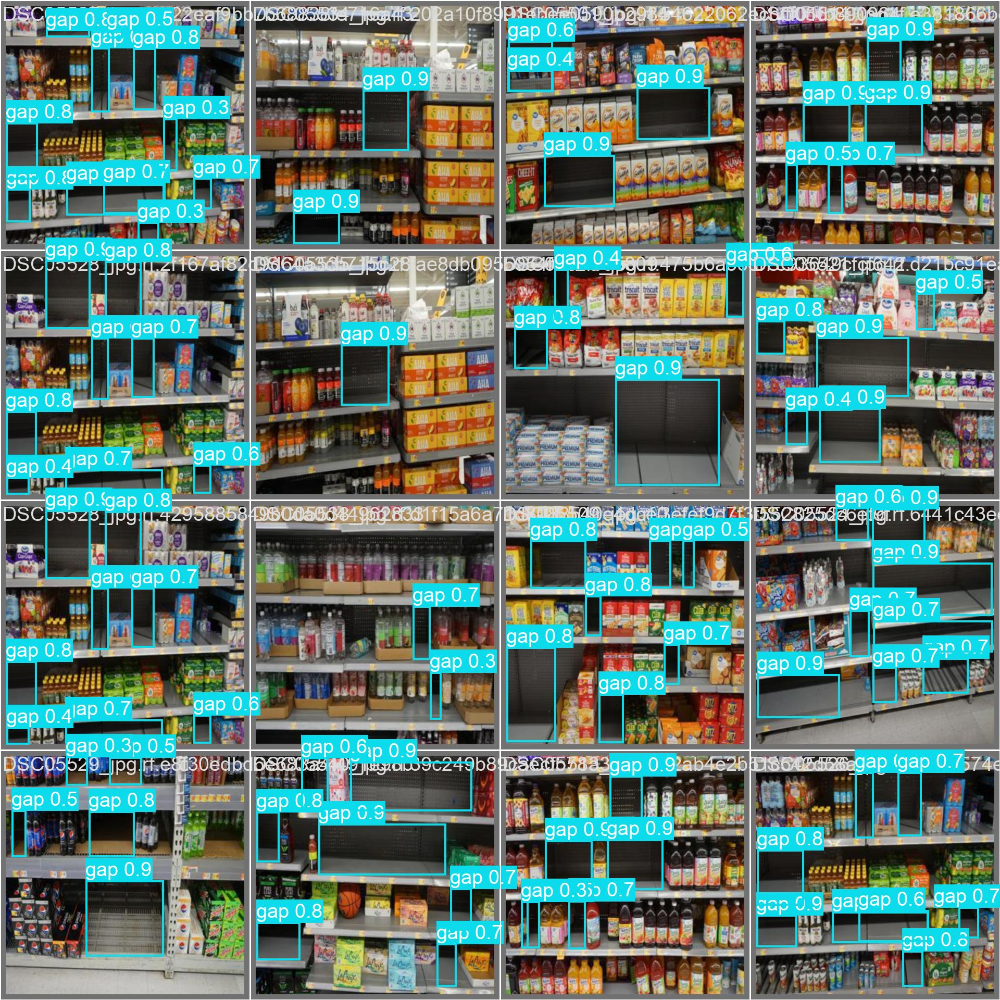

In [91]:
Image("/content/runs/detect/train/val_batch0_pred.jpg", width=600)

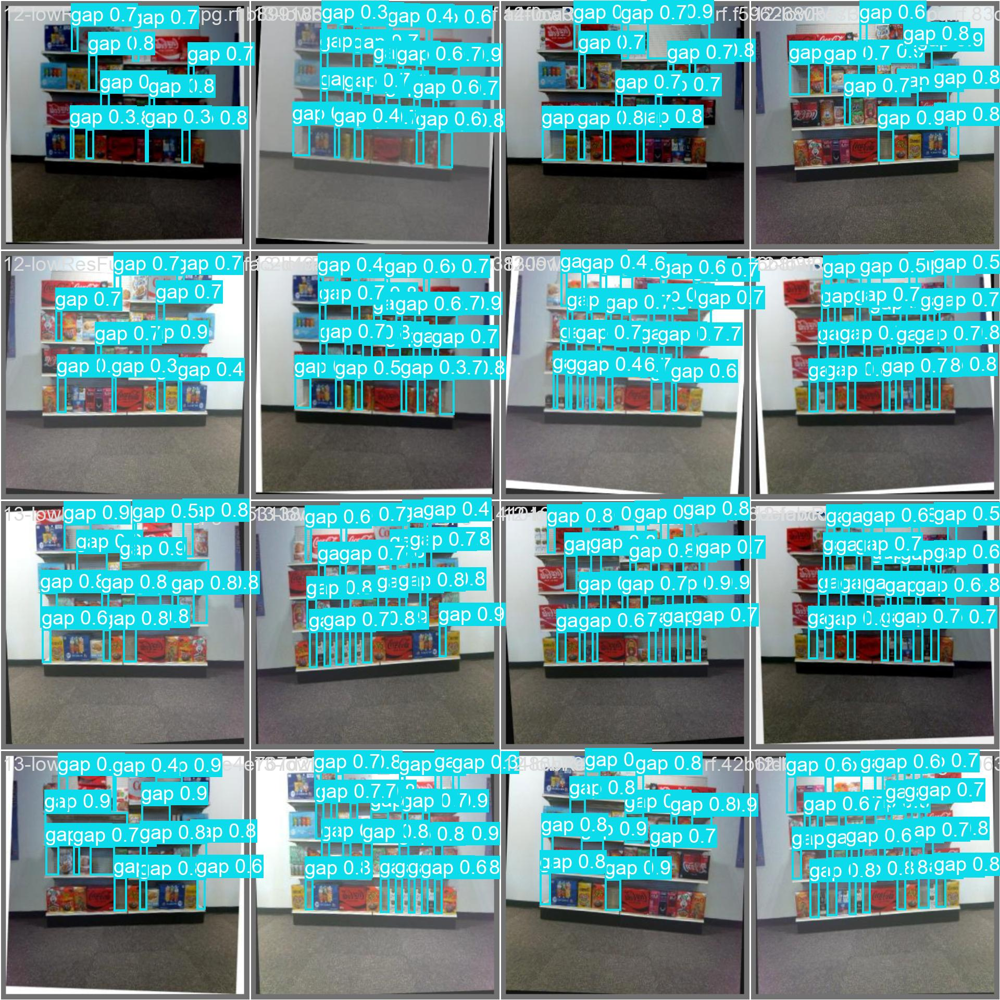

In [92]:
Image("/content/runs/detect/train/val_batch1_pred.jpg", width=600)

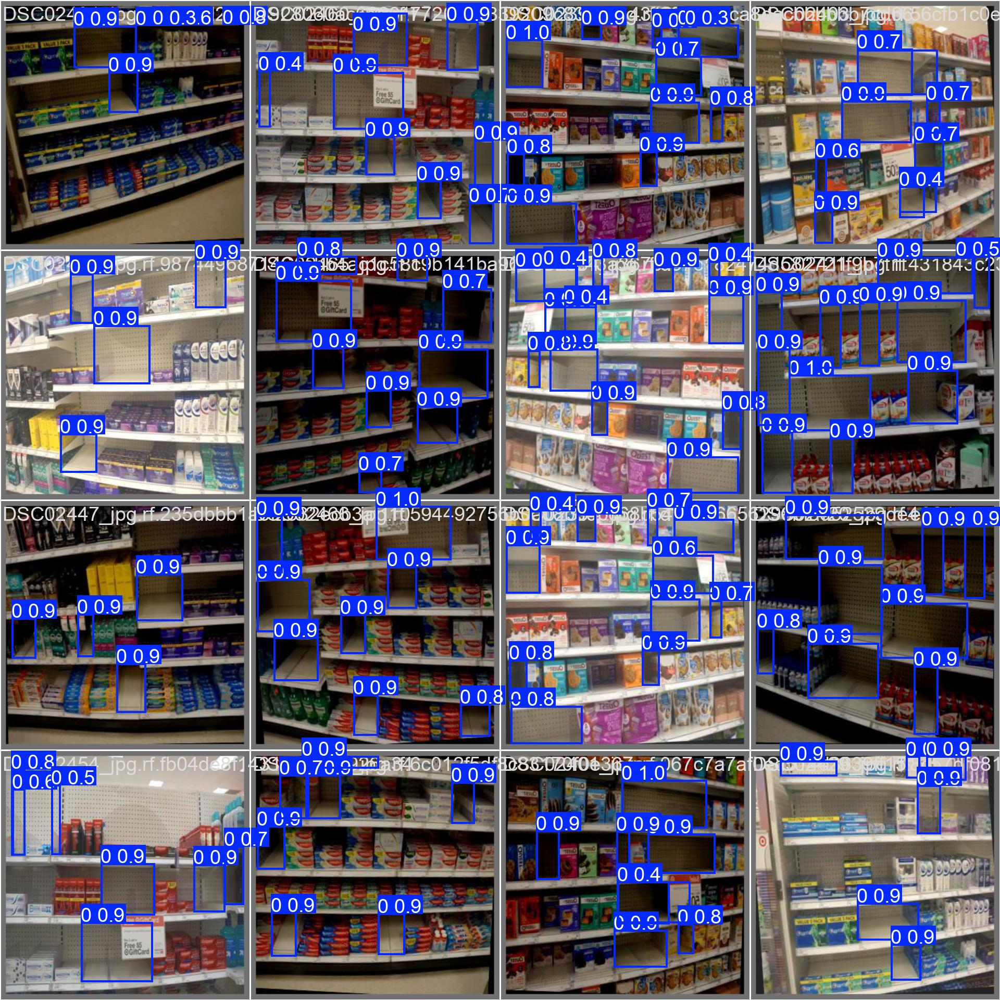

In [93]:
Image("/content/runs/detect/train/val_batch2_pred.jpg", width=600)

In [94]:
from google.colab import drive

In [95]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [103]:
!mv /content/runs/detect/train2/weights/best.pt /content/drive/MyDrive/best.pt



**Step # 06 Download the Model Weights from the Google Drive**

In [106]:
!gdown "https://drive.google.com/uc?id=1-Br-pf2DwqqItzmmBINJC7vWN6iyH7iN&confirm=t"


Downloading...
From: https://drive.google.com/uc?id=1-Br-pf2DwqqItzmmBINJC7vWN6iyH7iN&confirm=t
To: /content/best.pt
100% 5.47M/5.47M [00:00<00:00, 35.0MB/s]


**Step # 07  Validate Fine-Tuned Model**

In [107]:
!yolo task=detect mode=val model="best.pt" data={dataset.location}/data.yaml

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs
val: Scanning /content/retail-shelf-avialability-3/valid/labels.cache... 603 images, 0 backgrounds, 0 corrupt: 100% 603/603 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 38/38 [00:09<00:00,  4.08it/s]
                   all        603       3165      0.935      0.943      0.977      0.746
                     0         19        134      0.943      0.979      0.987      0.745
                   gap        584       3031      0.927      0.908      0.967      0.746
Speed: 1.8ms preprocess, 4.4ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/val5
💡 Learn more at https://docs.ultralytics.com/modes/val


**Step # 08 Inference with Custom Model on Images**

In [108]:
!yolo task=detect mode=predict model= best.pt conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs

image 1/302 /content/retail-shelf-avialability-3/test/images/11-lowResFull_103-1-_jpg.rf.2b27a4fea13ec800c59ab1ba382cfe47.jpg: 640x640 10 gaps, 10.5ms
image 2/302 /content/retail-shelf-avialability-3/test/images/11-lowResFull_103-1-_jpg.rf.2fa52befd84846a76b923cb25b452a1c.jpg: 640x640 10 gaps, 9.0ms
image 3/302 /content/retail-shelf-avialability-3/test/images/11-lowResFull_103-1-_jpg.rf.31cab40258249b57efbeec8a4f07e1a6.jpg: 640x640 10 gaps, 8.1ms
image 4/302 /content/retail-shelf-avialability-3/test/images/11-lowResFull_103_jpg.rf.60327bdeffd6b3e8698197e6de1615cf.jpg: 640x640 10 gaps, 8.1ms
image 5/302 /content/retail-shelf-avialability-3/test/images/11-lowResFull_10_jpg.rf.10de7e98c7659247aede65e37e944840.jpg: 640x640 15 gaps, 8.0ms
image 6/302 /content/retail-shelf-avialability-3/test/images/11-lowResFull_39-1-_jpg.rf.a5

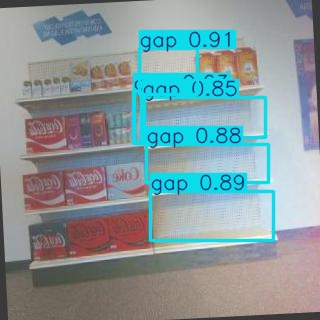

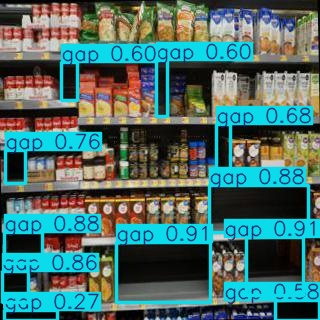

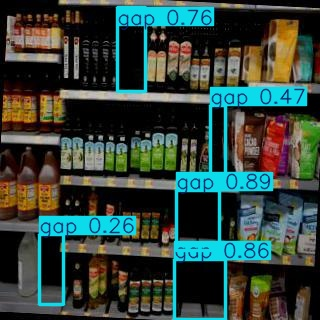

In [109]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")

In [118]:
!yolo task=detect mode=predict model= best.pt conf=0.25 source=/content/pic2.jpg save=True

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /content/pic2.jpg: 352x640 4 gaps, 46.4ms
Speed: 2.8ms preprocess, 46.4ms inference, 739.1ms postprocess per image at shape (1, 3, 352, 640)
Results saved to runs/detect/predict10
💡 Learn more at https://docs.ultralytics.com/modes/predict


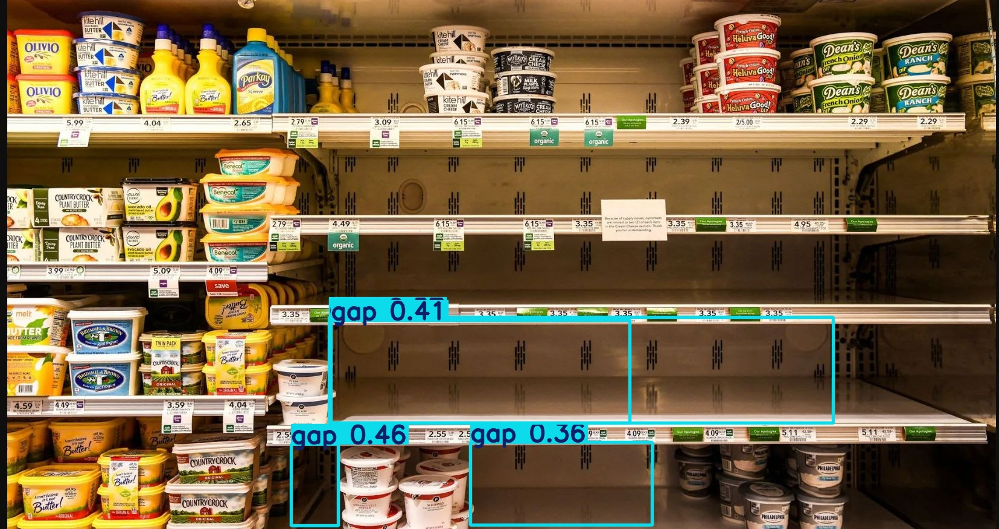

In [119]:
Image("/content/runs/detect/predict10/pic2.jpg", width=600)

**Step # 08 Inference with Custom Model on Videos**

In [120]:
!gdown "https://drive.google.com/uc?id=1vxxoJZxPNRMaN_TL5ERJgQMdQ--ePWGf&confirm=t"


Downloading...
From: https://drive.google.com/uc?id=1vxxoJZxPNRMaN_TL5ERJgQMdQ--ePWGf&confirm=t
To: /content/6178877-hd_1280_720_60fps.mp4
100% 2.35M/2.35M [00:00<00:00, 17.2MB/s]


In [121]:
!yolo task=detect mode=predict model= best.pt conf=0.25 source="/content/6178877-hd_1280_720_60fps.mp4" save=True

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/415) /content/6178877-hd_1280_720_60fps.mp4: 384x640 (no detections), 74.0ms
video 1/1 (frame 2/415) /content/6178877-hd_1280_720_60fps.mp4: 384x640 (no detections), 14.9ms
video 1/1 (frame 3/415) /content/6178877-hd_1280_720_60fps.mp4: 384x640 (no detections), 15.0ms
video 1/1 (frame 4/415) /content/6178877-hd_1280_720_60fps.mp4: 384x640 (no detections), 14.9ms
video 1/1 (frame 5/415) /content/6178877-hd_1280_720_60fps.mp4: 384x640 (no detections), 15.3ms
video 1/1 (frame 6/415) /content/6178877-hd_1280_720_60fps.mp4: 384x640 (no detections), 16.3ms
video 1/1 (frame 7/415) /content/6178877-hd_1280_720_60fps.mp4: 384x640 (no detections), 15.1ms
video 1/1 (frame 8/415) /content/6178877-hd_1280_720_60fps.mp4: 384x640 (no detections), 13.2ms
video 1/1 (frame 9/415) /content/6178877-hd_1280_720_60fps.mp4: 38

In [122]:
!rm '/content/result_compressed.mp4'

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [123]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict11/6178877-hd_1280_720_60fps.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)